In [4]:
import torch
import torch.nn as nn
import torchvision.models as models

class GraphFeatureEncoder(nn.Module):
    """
    Encode (norm_coord, node_feat, edge_feat) into a fixed-size vector.
    Assumes edge_feat[..., -1] is the weight for each neighbor.
    """
    def __init__(self,
                 node_feat_dim: int,
                 edge_feat_dim: int,
                 coord_dim: int = 2,
                 hidden_dim: int = 64,
                 output_dim: int = 32,
                 negative_slope: float = 0.01):
        super().__init__()
        # embed the per-node features
        self.node_mlp = nn.Sequential(
            nn.Linear(node_feat_dim, hidden_dim),
            nn.LeakyReLU(negative_slope),
            nn.Linear(hidden_dim, hidden_dim),
            nn.LeakyReLU(negative_slope),
        )
        # embed the aggregated edge features
        self.edge_mlp = nn.Sequential(
            nn.Linear(edge_feat_dim - 1, hidden_dim),  # drop the weight dim
            nn.LeakyReLU(negative_slope),
            nn.Linear(hidden_dim, hidden_dim),
            nn.LeakyReLU(negative_slope),
        )
        # final fusion MLP
        fusion_in = coord_dim + hidden_dim + hidden_dim
        self.fusion_mlp = nn.Sequential(
            nn.Linear(fusion_in, hidden_dim),
            nn.LeakyReLU(negative_slope),
            nn.Linear(hidden_dim, output_dim),
            nn.LeakyReLU(negative_slope),
        )

    def forward(self,
                norm_coord: torch.Tensor,
                node_feat: torch.Tensor,
                adj_list,                  # unused, since edge_feat has weights
                edge_feat: torch.Tensor) -> torch.Tensor:
        """
        norm_coord: [B,2]
        node_feat:  [B, F_node]
        edge_feat:  [B, K, F_edge] where edge_feat[..., -1] = weight
        adj_list:   list-of-lists (ignored here)
        """
        B, K, F = edge_feat.shape

        # 1) node embedding
        h_node = self.node_mlp(node_feat)           # [B, hidden_dim]

        # 2) weighted aggregate of edge features (drop last dim = weight)
        feats = edge_feat[..., :-1]                  # [B, K, F_edge-1]
        weights = edge_feat[..., -1].unsqueeze(-1)   # [B, K, 1]
        weighted_sum = (feats * weights).sum(dim=1)  # [B, F_edge-1]
        norm = weights.sum(dim=1).clamp(min=1e-6)    # [B,1]
        agg = weighted_sum / norm                    # [B, F_edge-1]

        h_edge = self.edge_mlp(agg)                  # [B, hidden_dim]

        # 3) fuse with norm_coord
        x = torch.cat([norm_coord, h_node, h_edge], dim=1)  # [B, coord+hid+hid]
        return self.fusion_mlp(x)     


def get_resnet50_backbone(output_dim=128):
    resnet = models.resnet50(pretrained=True)
    modules = list(resnet.children())[:-1]  # remove last fc layer
    resnet_backbone = nn.Sequential(*modules)
    for param in resnet_backbone.parameters():
        param.requires_grad = False  # freeze if retraining is not desired
    projection = nn.Sequential(
        nn.Flatten(),
        nn.Linear(resnet.fc.in_features, output_dim),
        nn.LeakyReLU(0.01)
    )
    return nn.Sequential(resnet_backbone, projection)


class MLPDecoder(nn.Module):
    def __init__(self, input_dim, output_dim=35, negative_slope=0.01):
        super().__init__()
        self.shared = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.LeakyReLU(negative_slope),
            nn.Dropout(p=0.1),
            nn.Linear(128, 64),
            nn.LeakyReLU(negative_slope),
            nn.Dropout(p=0.1),
            nn.Linear(64, output_dim)
        )

    def forward(self, x):
        return self.shared(x)


class VisionMLP_MultiTask(nn.Module):
    def __init__(self,
                 cnn_out_dim=128,
                 graph_out_dim=32,   # 最終 graph 特徵維度
                 output_dim=35,
                 negative_slope=0.01):
        super().__init__()
        # 三條 vision 分支不動
        self.encoder_tile       = get_resnet50_backbone(cnn_out_dim)
        self.encoder_subtiles   = get_resnet50_backbone(cnn_out_dim)
        self.encoder_neighbors = get_resnet50_backbone(cnn_out_dim)

        # 重新設定 graph encoder 的輸入維度
        NODE_FEAT_DIM = 12     # 你的 node_feat 長度
        EDGE_FEAT_DIM = 5      # 每條邊 5 維 (distance, dx, dy, angle, weight)
        self.encoder_graph = GraphFeatureEncoder(
            node_feat_dim=NODE_FEAT_DIM,
            edge_feat_dim=EDGE_FEAT_DIM,
            coord_dim=2,       # norm_coord = 2 維
            hidden_dim=64,
            output_dim=graph_out_dim,
            negative_slope=negative_slope
        )

        # decoder 現在接 3 條 CNN output + 一條 graph embedding
        decoder_in_dim = cnn_out_dim * 3 + graph_out_dim
        self.decoder = MLPDecoder(input_dim=decoder_in_dim,
                                  output_dim=output_dim,
                                  negative_slope=negative_slope)

    def forward(self,
                tile: torch.Tensor,           # [B,  3, H, W]
                neighbors: torch.Tensor,      # [B,  8, 3, H, W]  ← 這是影像鄰居
                norm_coord: torch.Tensor,     # [B,  2]
                node_feat: torch.Tensor,      # [B, 12]
                adj_list,                     # list-of-lists (每筆長度 15)，GraphEncoder 接口保留
                edge_feat: torch.Tensor       # [B, 15, 5]
               ) -> torch.Tensor:

        B = tile.size(0)
        # —— CNN 分支 —— 
        f_tile = self.encoder_tile(tile)  # [B, cnn_out_dim]
        
        # subtiles 平均池化
        _, N, C, H, W = subtiles.shape   # N=9
        f_sub = self.encoder_subtiles(
            subtiles.view(B*N, C, H, W)
        ).view(B, N, -1).mean(1)         # [B, cnn_out_dim]

        # image neighbors 平均池化
        _, M, C, H, W = neighbors.shape  # M=8
        f_neigh = self.encoder_neighbors(
            neighbors.view(B*M, C, H, W)
        ).view(B, M, -1).mean(1)         # [B, cnn_out_dim]

        # —— graph features 分支 ——
        # norm_coord [B,2], node_feat [B,12], edge_feat [B,15,5]
        f_graph = self.encoder_graph(norm_coord, node_feat, adj_list, edge_feat)  # [B, graph_out_dim]

        # 串起所有特徵
        x = torch.cat([f_tile, f_sub, f_neigh, f_graph], dim=1)  # [B, cnn_out_dim*3 + graph_out_dim]
        return self.decoder(x)



model = VisionMLP_MultiTask()


In [7]:
import os
import torch
import random
import inspect
from python_scripts.operate_model import get_model_inputs

def load_all_tile_data(folder_path,
                       model,
                       fraction: float = 0.25,
                       shuffle: bool = False):
    """
    Load a fraction of .pt files in a folder—but only keep the keys that
    model.forward() actually needs, plus 'label'.

    Args:
      folder_path (str): 資料夾路徑
      model: 要使用的 PyTorch 模型（會根據 forward() signature 自動挑欄位）
      fraction (float): 要讀取的檔案比例 (0 < fraction <= 1)
      shuffle (bool): 如果 True，先打亂再抽 sample

    Returns:
      dict of lists: 只包含 model.forward() 的參數名稱，以及 'label'。
    """
    # 先抓 signature
    sig = get_model_inputs(model, print_sig=False)
    forward_keys = list(sig.parameters.keys())
    required_keys = set(forward_keys + ['label'])

    # 列出所有 .pt
    pt_files = sorted(f for f in os.listdir(folder_path) if f.endswith('.pt'))
    N = len(pt_files)
    keep_n = max(1, int(N * fraction))
    if shuffle:
        pt_files = random.sample(pt_files, keep_n)
    else:
        pt_files = pt_files[N-keep_n:]
    print(f"➡️ 共 {N} 檔，這次 load {len(pt_files)} 檔 ({fraction*100:.1f}%)")
    print(f"➡️ {N-keep_n} , {len(pt_files)})")
    # 先建一個完整的 dict，再只挑必要欄位
    # 不過為了記憶體節省，也可以直接只初始化 required_keys
    full_dict = {k: [] for k in required_keys.union({'source_idx'})}

    for fname in pt_files:
        path = os.path.join(folder_path, fname)
        try:
            d = torch.load(path, map_location='cpu')
        except Exception as e:
            print(f"❌ 無法讀 {fname}: {e}")
            continue

        # source_idx 幫你追原始檔名或 index
        full_dict['source_idx'].append(fname)

        # 只收 model 需要的參數 + label
        for k in required_keys:
            full_dict.setdefault(k, []).append(d.get(k, None))

    return full_dict
# 用法範例
folder = "./dataset/spot-rank/version-1/node_features_train"
grouped_data = load_all_tile_data(
        folder_path=folder,
        model=model,
        fraction=0.01,
        shuffle=True
    )

    # grouped_data 現在只會有 model.forward() 需要的 key，
    # 像 ['tile','subtiles','neighbors','norm_coord','node_feat','adj_list','edge_feat','label','source_idx']
print("Loaded keys:", grouped_data.keys())
print("Samples:", len(next(iter(grouped_data.values()))))


➡️ 共 32724 檔，這次 load 327 檔 (1.0%)
➡️ 32397 , 327)


/var/folders/7g/j5s0yzcj34l3v043s7znkplc0000gn/T/ipykernel_29170/2818178936.py:46: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  d = torch.load(path, map_location='cpu')


Loaded keys: dict_keys(['node_feat', 'source_idx', 'norm_coord', 'edge_feat', 'tile', 'adj_list', 'label', 'neighbors'])
Samples: 327


# Import Model

In [1]:
import os
save_folder = "output_folder/with_all_preprocess_log2/Masked-CNN+Res+MLP_3size_78_spot_version5/"  # 修改為你想要的資料夾名稱

submission_path = os.path.join(save_folder, "submission.csv")


/Users/deweywang/Desktop/GitHub/HEVisum/python_scripts/expression_plot_utils.py:241: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.93, 0.97])


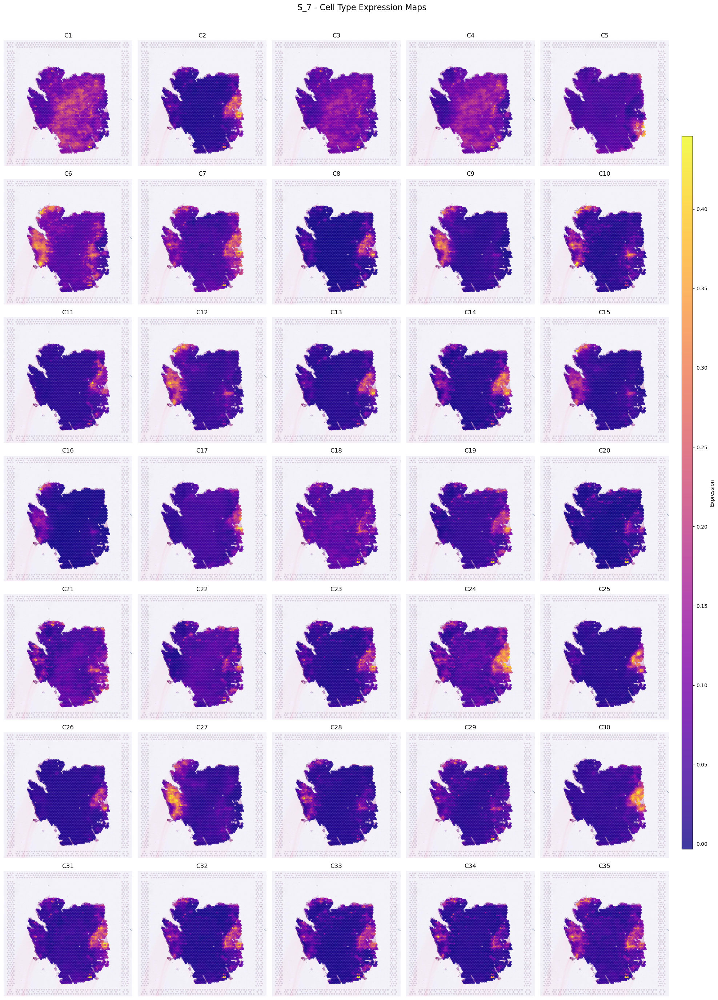

<Figure size 640x480 with 0 Axes>

In [2]:
from python_scripts.expression_plot_utils import plot_all_celltypes_on_slide
import matplotlib.pyplot as plt
plot_all_celltypes_on_slide(
    slide_id="S_7",
    submission_spot_data=submission_path
)
plot_path = os.path.join(save_folder, "expression_plot-try.pdf")

plt.savefig(plot_path)


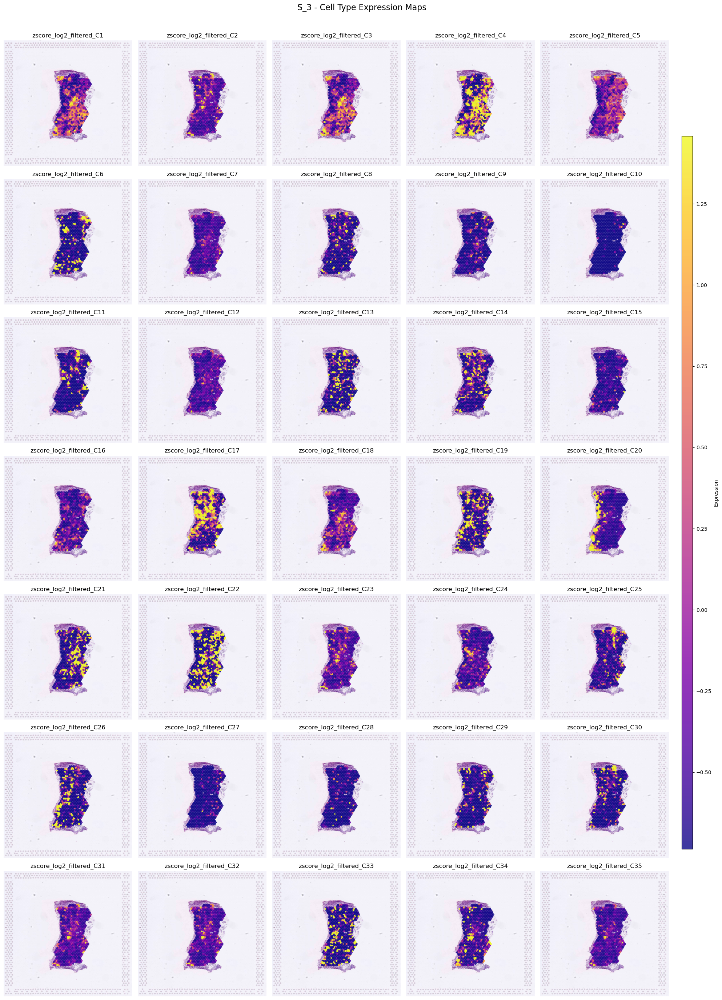

In [37]:
from python_scripts.expression_plot_utils import plot_all_celltypes_on_slide
plot_all_celltypes_on_slide(
    slide_id="S_3",
    spot_path_h5="./dataset/version-6/no_gu_clipIQR_processed_train_spots.h5",
    image_group="Train",
    spot_group="log2_Train",
    cell_prefix="zscore_log2_filtered_"
)



# Convert the original prediction into z-score

In [55]:
import numpy as np

def log2_transform(x, add_constant=1.0):
    return np.log2(x + add_constant)

def zscore_transform(x, mean, std):
    return (x - mean) / std

def convert_raw_to_zscore(expression, zscore_params, add_constant=1.0):
    """
    將原始表達量轉換為 z-score 標準化值。

    Parameters:
        expression (np.ndarray): shape (N, C)，原始表達量（每列為一個 spot，每欄為一個 cell type）
        zscore_params (dict): 每個 cell type 的 mean, std 值（使用 load_json_params 載入）
        add_constant (float): log2 轉換時避免 log(0)

    Returns:
        zscore_matrix: shape (N, C)，對應每個 cell type 的 z-score 值
    """
    expression = np.asarray(expression)
    zscored = np.zeros_like(expression)

    cell_types = sorted(zscore_params.keys(), key=lambda x: int(x[1:]))  # 例如 C1, C2, ..., C35

    for i, cell in enumerate(cell_types):
        mean = zscore_params[cell]["mean"]
        std = zscore_params[cell]["std"]

        log2_val = log2_transform(expression[:, i], add_constant=add_constant)
        zscored[:, i] = zscore_transform(log2_val, mean, std)

    return zscored


In [83]:
from python_scripts.revert_utils import (
    load_json_params,
    revert_log2_predictions,
)
import h5py
import pandas as pd

# Load and display (x,y) spot locations and cell type annotation table for Train slides
with h5py.File("dataset/spots-data/version-5/no_clip_gu_processed_train_spots.h5", "r") as f:
    train_spots = f["spots/log2_Train"]
    
    # Dictionary to store DataFrames for each slide
    train_spot_tables = {}
    
    for slide_name in train_spots.keys():
        # Load dataset as NumPy structured array
        spot_array = np.array(train_spots[slide_name])
        
        # Convert to DataFrame
        df = pd.DataFrame(spot_array)
        
        # Store in dictionary
        train_spot_tables[slide_name] = df
        print(slide_name)

# Example: Display the spots table for slide 'S_1'
train_spot_tables['S_1']

spots = train_spot_tables['S_1']


params = load_json_params('dataset/spots-data/version-5/zscore_params.json')


expression_data = spots[[col for col in spots.columns if col.startswith("zscore_log2_filtered_")]].values
restored = revert_log2_predictions(expression_data, params, add_constant=1)
zscore_cols = [col for col in spots]
zscore_cols= zscore_cols[2:]

restored = pd.DataFrame(restored, columns=zscore_cols)
restored

S_1
S_2
S_3
S_4
S_5
S_6


,zscore_log2_filtered_C1,zscore_log2_filtered_C2,zscore_log2_filtered_C3,zscore_log2_filtered_C4,zscore_log2_filtered_C5,zscore_log2_filtered_C6,zscore_log2_filtered_C7,zscore_log2_filtered_C8,zscore_log2_filtered_C9,zscore_log2_filtered_C10,...,zscore_log2_filtered_C26,zscore_log2_filtered_C27,zscore_log2_filtered_C28,zscore_log2_filtered_C29,zscore_log2_filtered_C30,zscore_log2_filtered_C31,zscore_log2_filtered_C32,zscore_log2_filtered_C33,zscore_log2_filtered_C34,zscore_log2_filtered_C35
0,0.014401,0.057499,0.022033,0.001704,0.533992,1.511707,0.015313,0.020029,1.127342,1.640794e+00,...,1.009572e-03,2.068237,0.121361,0.007344,0.000017,0.036891,0.035934,0.118937,0.001472,0.050057
1,0.116196,0.197176,0.110600,0.042614,5.587681,0.006885,0.096346,0.001711,0.023750,5.631729e-01,...,6.918171e-04,0.014442,0.000238,0.024071,0.000023,0.217589,0.100662,0.004027,0.004122,0.049491
2,0.133284,0.035880,0.061352,0.003073,1.104479,0.009174,0.009175,0.000114,0.169133,6.555302e-02,...,9.577447e-05,0.149792,0.001401,0.000699,0.000009,0.024491,0.018810,0.004171,0.000425,0.015348
3,0.087715,0.235223,0.090382,0.013902,8.760482,0.140912,0.188859,0.010154,0.325088,6.269745e-02,...,1.964150e-03,0.142549,0.002036,0.047165,0.000022,0.180372,0.202981,0.003709,0.001845,0.116022
4,0.128468,0.066399,0.098982,0.047022,3.425771,0.001009,0.026881,0.000468,0.040989,1.270878e-03,...,7.189078e-05,0.005920,0.000048,0.006359,0.000585,0.052661,0.032168,0.000107,0.000107,0.013103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,0.047236,0.112721,0.052490,0.002092,0.000913,0.393805,0.045220,0.013414,1.269679,4.363573e-01,...,7.530558e-03,0.559967,0.154793,0.133587,0.000013,0.051041,0.113100,0.003147,0.004971,0.128265
2145,0.070764,0.119310,0.193938,0.001239,0.003851,0.588956,0.037731,0.004072,1.354094,4.436013e-01,...,3.219223e-02,0.667076,0.094247,0.136623,0.000009,0.050518,0.119685,0.027743,0.016413,0.287171
2146,0.194491,0.048068,0.150061,0.002978,0.119206,0.000213,0.005332,0.000078,0.005106,1.911328e-05,...,2.628421e-04,0.000273,0.000022,0.000027,0.000042,0.029386,0.019977,0.000039,0.000119,0.006778
2147,0.002968,0.151899,0.015931,0.000071,1.354983,0.000152,0.019254,0.001267,0.001746,1.108487e-02,...,1.377452e-03,0.003754,0.001420,0.088000,0.000536,0.073240,0.113631,0.009040,0.000090,0.025716


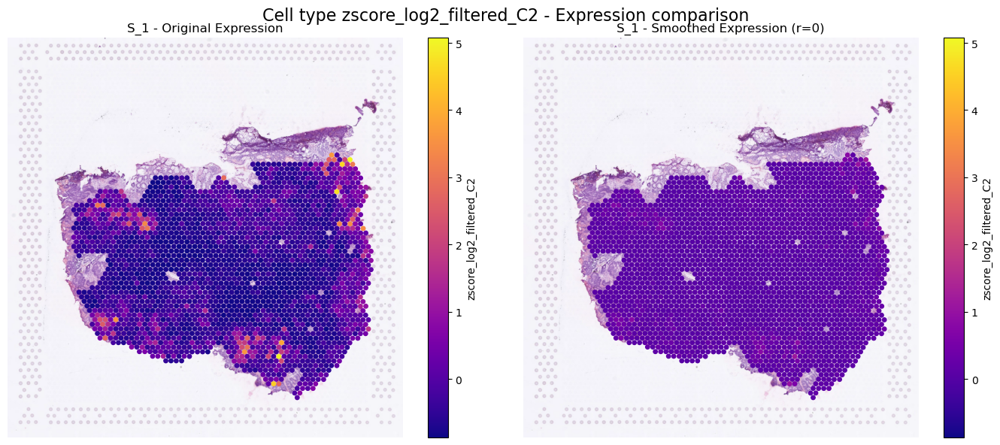

▶️ Spearman ρ = 1.0000, p = 0
▶️ Pearson  r = 0.9936, p = 0


In [ ]:
from python_scripts.spatial_smooth import plot_cell_expression_comparison


#from python_scripts.spatial_smooth import plot_cell_expression_comparison
cell_type = "zscore_log2_filtered_C2"  # 可以換成任何你要看的 Cx
plot_cell_expression_comparison(
    slide_id="S_1",
    cell_type=cell_type,
    original_df=train_spot_tables["S_1"],
    smoothed_df=restored,
    radius = 0,
    h5_path="./dataset/elucidata_ai_challenge_data.h5"
)

In [ ]:
from python_scripts.revert_utils import (
    load_json_params,
    revert_log2_predictions,
)
import h5py


# Load and display (x,y) spot locations and cell type annotation table for Train slides
with h5py.File("dataset/spots-data/version-5/no_clip_gu_processed_train_spots.h5", "r") as f:
    train_spots = f["spots/log2_Train"]
    
    # Dictionary to store DataFrames for each slide
    train_spot_tables = {}
    
    for slide_name in train_spots.keys():
        # Load dataset as NumPy structured array
        spot_array = np.array(train_spots[slide_name])
        
        # Convert to DataFrame
        df = pd.DataFrame(spot_array)
        
        # Store in dictionary
        train_spot_tables[slide_name] = df
        print(slide_name)

# Example: Display the spots table for slide 'S_1'
train_spot_tables['S_1']

spots = train_spot_tables['S_1']


params = load_json_params('dataset/spots-data/version-5/zscore_params.json')


expression_data = spots[[col for col in spots.columns if col.startswith("zscore_log2_filtered_")]].values
restored = revert_log2_predictions(expression_data, params, add_constant=1)
zscore_cols = [col for col in spots[2:]]

restored

S_1
S_2
S_3
S_4
S_5
S_6


array([[1.44007875e-02, 5.74991750e-02, 2.20327064e-02, ...,
        1.18937254e-01, 1.47176158e-03, 5.00566160e-02],
       [1.16195554e-01, 1.97175601e-01, 1.10600450e-01, ...,
        4.02737744e-03, 4.12233162e-03, 4.94914031e-02],
       [1.33283648e-01, 3.58796168e-02, 6.13523319e-02, ...,
        4.17073898e-03, 4.24626283e-04, 1.53477479e-02],
       ...,
       [1.94491076e-01, 4.80675386e-02, 1.50061200e-01, ...,
        3.92726743e-05, 1.19447103e-04, 6.77813517e-03],
       [2.96821841e-03, 1.51899269e-01, 1.59312109e-02, ...,
        9.03977272e-03, 8.98763017e-05, 2.57155630e-02],
       [2.32047287e-04, 4.75869479e-03, 1.37561003e-03, ...,
        2.79530166e-06, 1.29732190e-06, 4.68169135e-04]])

In [ ]:
cell_type = "zscore_log2_filtered_C8"  # 可以換成任何你要看的 Cx
plot_cell_expression_comparison(
    slide_id="S_2",
    cell_type=cell_type,
    original_df=train_spot_tables["S_2"],
    smoothed_df=smoothed_df,
    radius = 40,
    h5_path="./dataset/elucidata_ai_challenge_data.h5"
)

array([[-0.60324638, -0.43505269, -0.57076389, ...,  1.01632058,
        -0.41469013, -0.12664572],
       [-0.47209703,  0.5377606 , -0.43585131, ..., -0.32302683,
        -0.37280569, -0.13339212],
       [-0.45126023, -0.59702777, -0.50948166, ..., -0.3212621 ,
        -0.43126758, -0.54782073],
       ...,
       [-0.37912052, -0.50530405, -0.37917298, ..., -0.37222047,
        -0.4361022 , -0.654025  ],
       [-0.61879079,  0.23544403, -0.58048429, ..., -0.26147487,
        -0.43657074, -0.42052294],
       [-0.62253733, -0.83622375, -0.60391087, ..., -0.37267133,
        -0.43797432, -0.73280466]])

In [ ]:
import pandas as pd
from python_scripts.revert_utils import (
    load_json_params,
    revert_log2_predictions,
)
#params = load_json_params(json_path="./dataset/spots-data/version-1/zscore_params.json")
params = load_json_params('dataset/spots-data/version-5/zscore_params.json')
# 讀取 CSV，假設 cell 表達值在 C1 ~ C35 欄位
df = pd.read_csv(submission_path)
expression_data = df[[col for col in df.columns if col.startswith("C")]].values

# 或還原 log2
#params = load_json_params("./dataset/spots-data/version-4/zscore_params.json")
restored = revert_log2_predictions(expression_data, params, add_constant=1)

restored

array([[0.2477437 , 0.10408651, 0.16556569, ..., 0.00382405, 0.00669566,
        0.04071337],
       [0.25985202, 0.10083223, 0.17240258, ..., 0.00381485, 0.00667521,
        0.04023194],
       [0.29432309, 0.095992  , 0.18737704, ..., 0.00370953, 0.00654445,
        0.03913914],
       ...,
       [0.52068572, 0.09328123, 0.27629418, ..., 0.00367925, 0.00659426,
        0.03920829],
       [0.37248875, 0.09095611, 0.20959893, ..., 0.00368582, 0.00657994,
        0.03855271],
       [0.26438657, 0.10377477, 0.17692001, ..., 0.00377141, 0.00669882,
        0.04060031]])

Train S_1
Train S_2
Train S_3
Train S_4
Train S_5
Train S_6


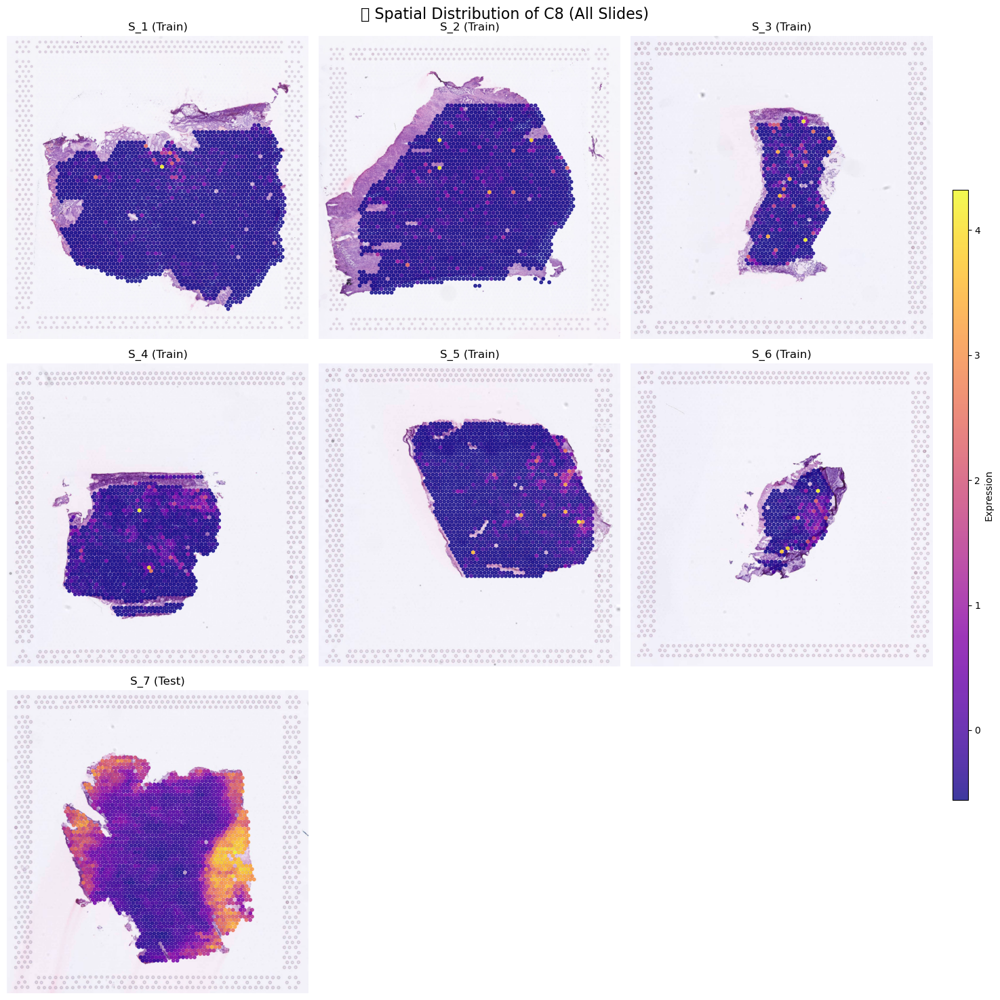

In [31]:
from python_scripts.expression_plot_utils import plot_cell_expression_all_slides

plot_cell_expression_all_slides(
    cell_short_name='C8',
    cell_prefix='zscore_log2_filtered_',
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="dataset/version-5/no_clip_gu_processed_train_spots.h5",
    group_name="log2_Train",
    dataset_type="Train",
    submission_spot_data = df_zscore
)

Train S_1
Train S_2
Train S_3
Train S_4
Train S_5
Train S_6


/Users/deweywang/Desktop/GitHub/HEVisum/python_scripts/expression_plot_utils.py:145: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.93, 1])
/Users/deweywang/Desktop/GitHub/HEVisum/python_scripts/expression_plot_utils.py:145: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 0.93, 1])
/opt/anaconda3/envs/spatialhackathon/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


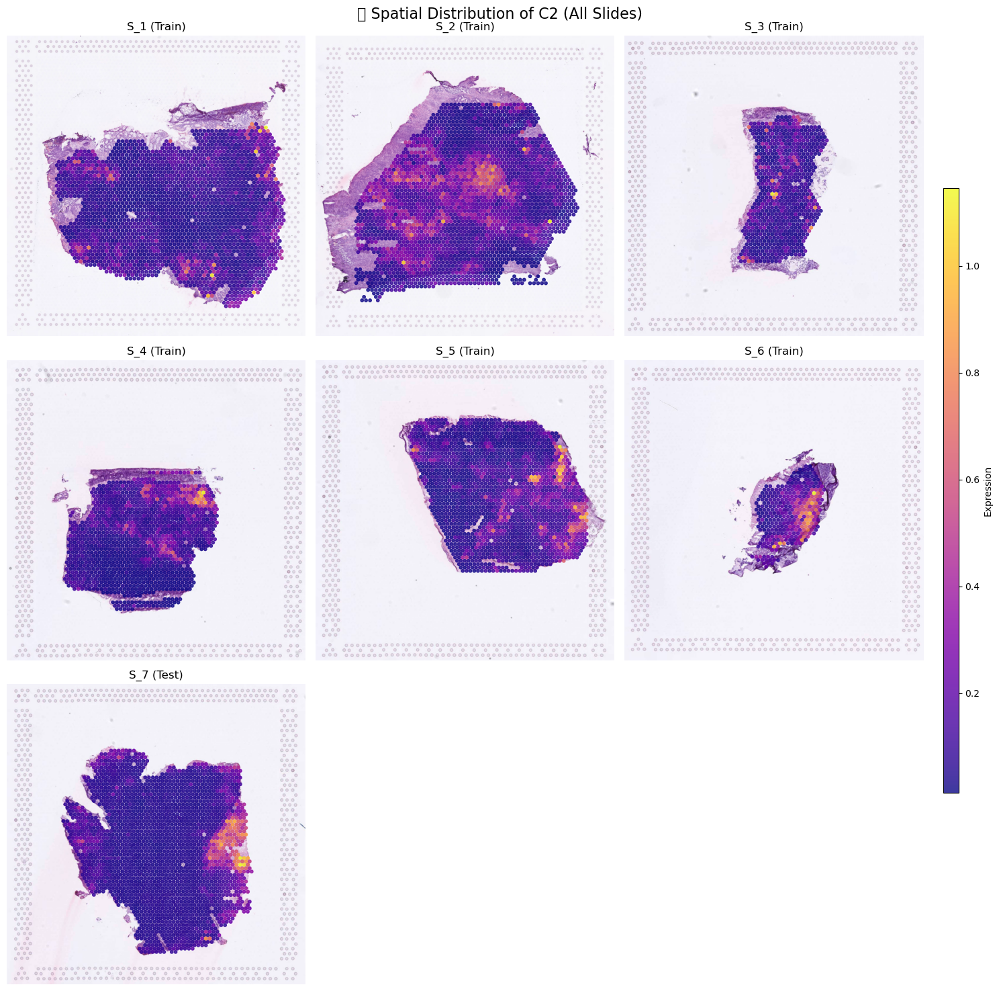

In [6]:
from python_scripts.expression_plot_utils import plot_cell_expression_all_slides
plot_cell_expression_all_slides(
    cell_short_name='C2',
    cell_prefix='',
    image_path="./dataset/elucidata_ai_challenge_data.h5",
    spot_path="./dataset/elucidata_ai_challenge_data.h5",
    group_name="Train",
    dataset_type="Train",
    submission_spot_data = submission_path
)